# Libraries

In [107]:
using Images, TestImages, ImageMorphology, ImageBinarization, Clustering, ImageSegmentation, Random, LocalFilters

# User-Defined functions

In [2]:
function load_local_or_test(image_path, local_train = "l")
    """
    The input defines if this function will load a local image or one from TestImages library
    
    Input:
    * local_train: If it contains a value "t", the function will load a test image. Default is a local image
    * image_path: Path for image location, or name of test image.
    """
    
    # Loading local or test image
    if local_train == "t"
        img = testimage(image_path);
    else 
        img = load(image_path);
    end
end;

In [3]:
function mosaic_output_1d(img_left, img_right, mosaic = true)
    """    
    Input:
    * img_left: Original image
    * img_right: New and processed image
    * mosaic: Boolean parameter defining if this function will return either a mosaic of two images side by side or a single image
    
    """
    if mosaic
        return mosaicview(img_left, img_right; nrow = 1)
    else 
        return img_right
    end
end;

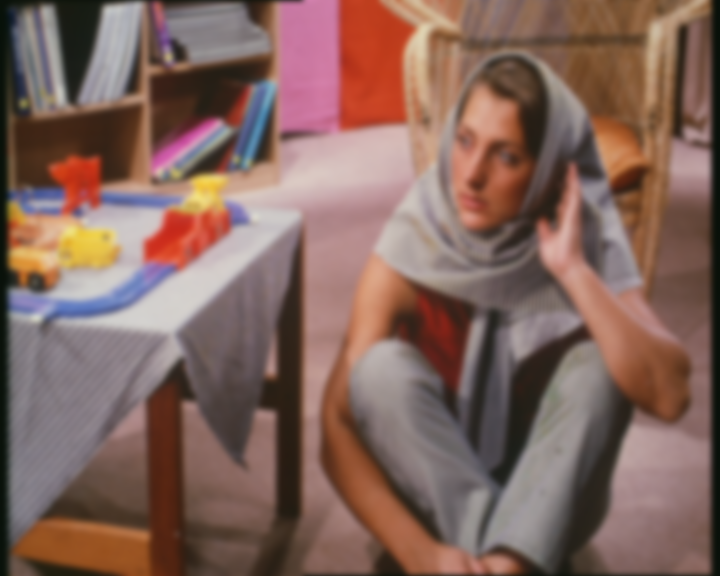

In [122]:
img = testimage("barbara_color")
κ = Kernel.gaussian(3) # Kernel.LoG(5)
imfilter(img, κ)
#conv_img = convolve(img, κ)
#colorview(BGR,conv_img)

In [113]:
typeof(conv_img)

Matrix{Float64} (alias for Array{Float64, 2})

# Main

## > Segmentation

### Otsu segmentation (Grayscale)
[Source](https://juliaimages.org/ImageBinarization.jl/stable/)

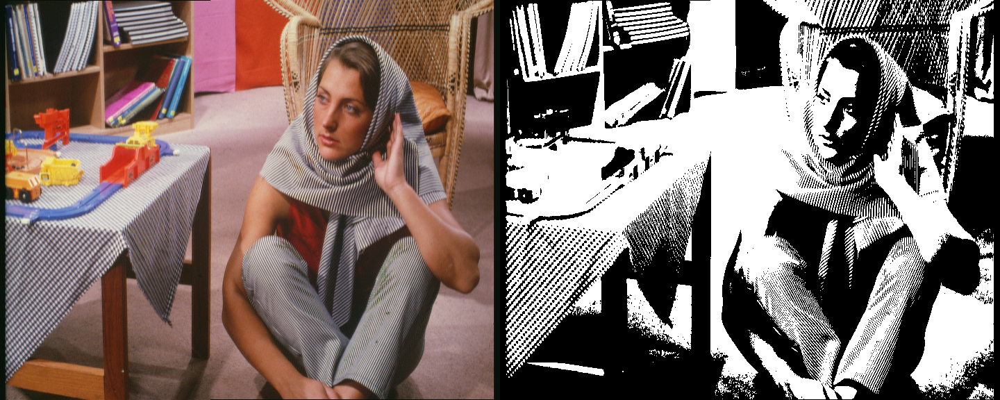

In [5]:
img = testimage("barbara_color")
mosaic_output_1d(img, binarize(img, Otsu()) )

In [6]:
δ₀, δ₁, δ₂, δ₃ = 1, 2, 3, 4

(1, 2, 3, 4)

### K-means segmentation

a) k = 2

b) k = 3

c) k = 4

### Fuzzy C-means segmentation
Fuzzy C-means clustering is widely used for unsupervised image segmentation. Unlike K-means, it allows pixels to belong to two or more clusters. 

[Source](https://juliaimages.org/v0.21/imagesegmentation/#Fuzzy-C-means-1)
[Documentation](https://github.com/JuliaStats/Clustering.jl/blob/master/doc/source/fuzzycmeans.md)

`fuzzy_cmeans()` parameters:
* Image
* Number of clusters
* Fuzzy factor

In [45]:
img = testimage("barbara_color");
size(img)

(576, 720)

a) C = 2

In [78]:
r =  fuzzy_cmeans(img, 3, 2) 

FuzzyCMeansResult: 3 clusters for 414720 points in 3 dimensions (converged in 14 iterations)

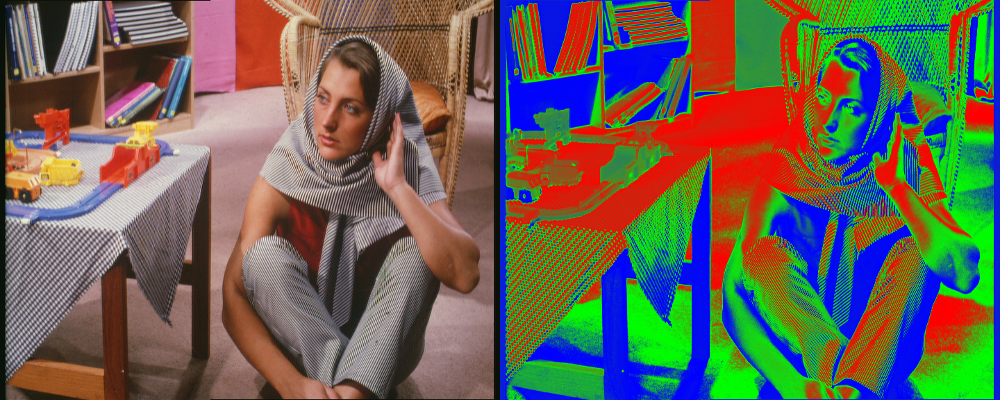

In [83]:
random_img_array = reshape(r.weights, size(img)[1], size(img)[2], 3)
img_perm = permutedims(random_img_array, [3, 1, 2])
mosaicview(img, colorview(BGR, img_perm), nrow = 1)

b) C = 3

In [71]:
r =  fuzzy_cmeans(img, 3, 3) 

FuzzyCMeansResult: 3 clusters for 414720 points in 3 dimensions (converged in 2 iterations)

LoadError: MethodError: no method matching *(::RGB{Float32}, ::Matrix{Float64})
Math on colors is deliberately undefined in ColorTypes, but see the ColorVectorSpace package.
[0mClosest candidates are:
[0m  *(::Any, ::Any, [91m::Any[39m, [91m::Any...[39m) at operators.jl:591
[0m  *([91m::Union{LinearAlgebra.Adjoint{var"#s884", <:StridedMatrix{T} where T}, LinearAlgebra.Transpose{var"#s884", <:StridedMatrix{T} where T}, StridedMatrix{var"#s884"}} where var"#s884"<:Union{Float32, Float64}[39m, ::Union{LinearAlgebra.Adjoint{var"#s883", <:StridedMatrix{T} where T}, LinearAlgebra.Transpose{var"#s883", <:StridedMatrix{T} where T}, StridedMatrix{var"#s883"}} where var"#s883"<:Union{Float32, Float64}) at /opt/julia-1.8.0/share/julia/stdlib/v1.8/LinearAlgebra/src/matmul.jl:146
[0m  *([91m::StridedMatrix{var"#s884"} where var"#s884"<:Union{ComplexF32, ComplexF64}[39m, ::Union{LinearAlgebra.Adjoint{var"#s883", <:StridedMatrix{T} where T}, LinearAlgebra.Transpose{var"#s883", <:StridedMatrix{T} where T}, StridedMatrix{var"#s883"}} where var"#s883"<:Union{Float32, Float64}) at /opt/julia-1.8.0/share/julia/stdlib/v1.8/LinearAlgebra/src/matmul.jl:165
[0m  ...

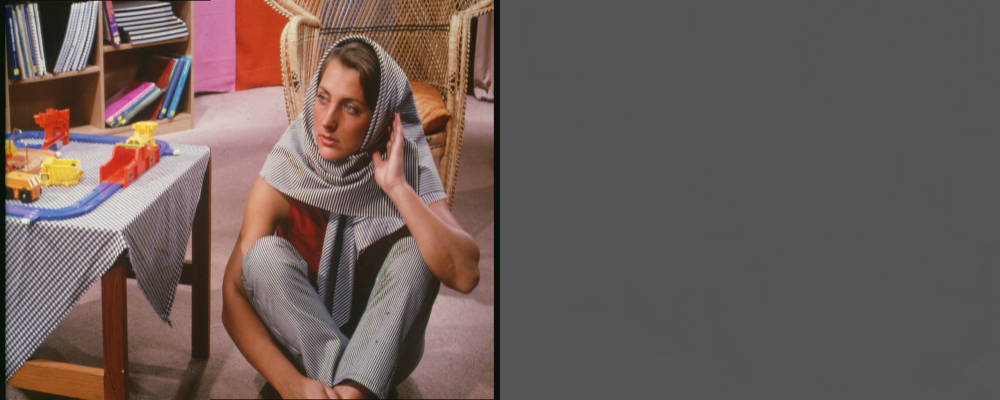

In [72]:
random_img_array = reshape(r.weights, size(img)[1], size(img)[2], 3)
img_perm = permutedims(random_img_array, [3, 1, 2])
mosaicview(img, colorview(RGB, img_perm), nrow = 1)

c) C = 4

In [73]:
r =  fuzzy_cmeans(img, 3, 4) 

FuzzyCMeansResult: 3 clusters for 414720 points in 3 dimensions (converged in 2 iterations)

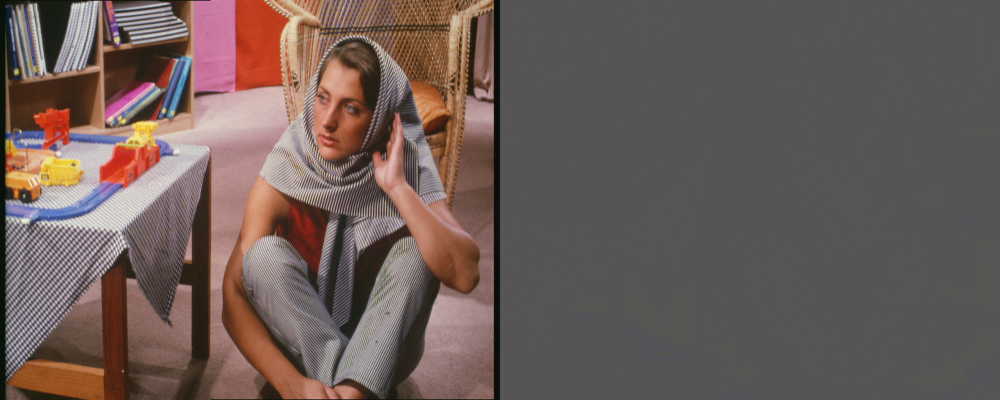

In [74]:
random_img_array = reshape(r.weights, size(img)[1], size(img)[2], 3)
img_perm = permutedims(random_img_array, [3, 1, 2])
mosaicview(img, colorview(RGB, img_perm), nrow = 1)

### Region growing (Seed a single object)

In [11]:
function seed_grow_image(img, seeds, mosaic = true)
    segments = seeded_region_growing(img, seeds)

    sg_img = map(i->segment_mean(segments,i), labels_map(segments))
    
    return mosaic_output_1d(img, sg_img, mosaic)
end;

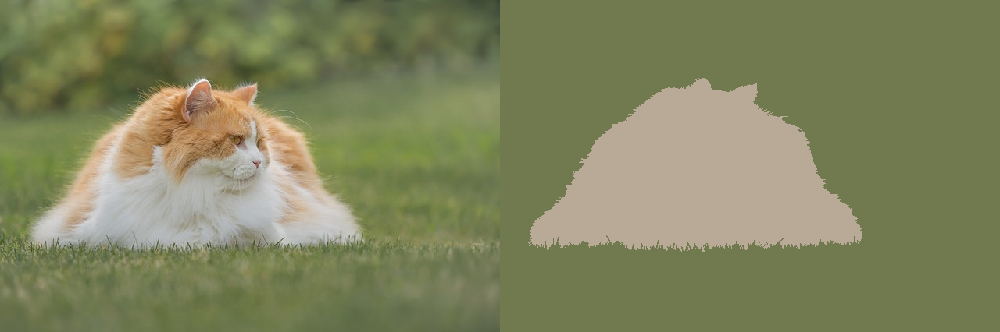

In [12]:
# ----------------------------
# Simple image test
# ----------------------------

# Inputs:
img = load("Images/cat-3352842_640.jpg");
# Segments are defined as arrays of tuples using CartesianIndex. We choose pixels as seeds.
seeds = [(CartesianIndex(308, 318),1), 
         (CartesianIndex(220, 500),2)]

# Seed Growing function
sg_img = seed_grow_image(img, seeds)

### Isodata Segmentation

## > Mathematical Morphology

### Opening

In [13]:
# load an image and first convert to grayscale and then binarize
function binarize_image(image_path, condition, binary_threshold, local_train = "l", mosaic = true)

    """
    Inputs:
    * local_train: "l" or anything else
    * condition: {"<", ">", "<-", ">=", "=="}
    """    
    
    img = load_local_or_test(image_path, local_train)
    
    if condition == "<"
        img_binary = Gray.(1 * Gray.(img) .< binary_threshold)
        
    elseif condition == ">"
        img_binary = Gray.(1 * Gray.(img) .> binary_threshold)
        
    elseif condition == "<="
        img_binary = Gray.(1 * Gray.(img) .<= binary_threshold)
        
    elseif condition == ">="
        img_binary = Gray.(1 * Gray.(img) .>= binary_threshold)
        
    elseif condition == "=="
        img_binary = Gray.(1 * Gray.(img) .== binary_threshold)        
    end

    return mosaic_output_1d(1 * img, img_binary, mosaic)
    
end;

In [14]:
function opening_image(image_path, condition, b_g, binary_threshold, local_train = "l", mosaic = true)

    # Loading local or test image
    img = load_local_or_test(image_path, local_train)
    
    if b_g == "b"
        binarized_img = binarize_image(image_path, condition, binary_threshold, local_train, false)
    else
       binarized_img = Gray.(img)
    end

    
    binarized_img = opening(binarized_img)
            
    return mosaic_output_1d(img, binarized_img, mosaic)
    
end;

binary

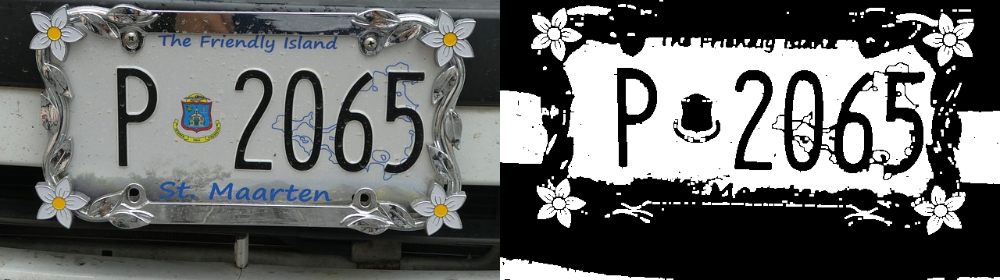

In [15]:
opening_image("Images/caribbean-plate.jpg", ">", "b", 0.5)

grayscale

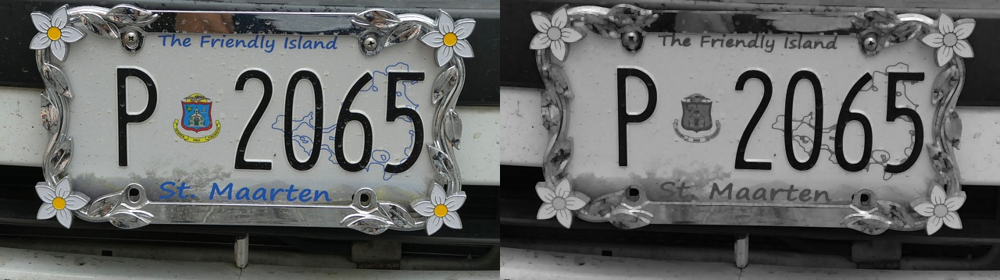

In [16]:
opening_image("Images/caribbean-plate.jpg", ">", "g", 0.5)

### Closing

In [17]:
function closing_image(image_path, condition, b_g, binary_threshold, local_train = "l", mosaic = true)

    # Loading local or test image
    img = load_local_or_test(image_path, local_train)
    
    if b_g == "b"
        binarized_img = binarize_image(image_path, condition, binary_threshold, local_train, false)
    else
       binarized_img = Gray.(img)
    end
    
    binarized_img = closing(binarized_img)
        
    return mosaic_output_1d(img, binarized_img, mosaic)
    
end;

binary

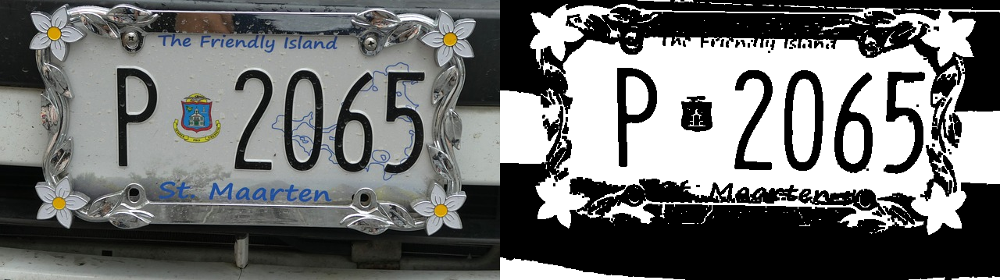

In [18]:
closing_image("Images/caribbean-plate.jpg", ">", "b", 0.5)

grayscale

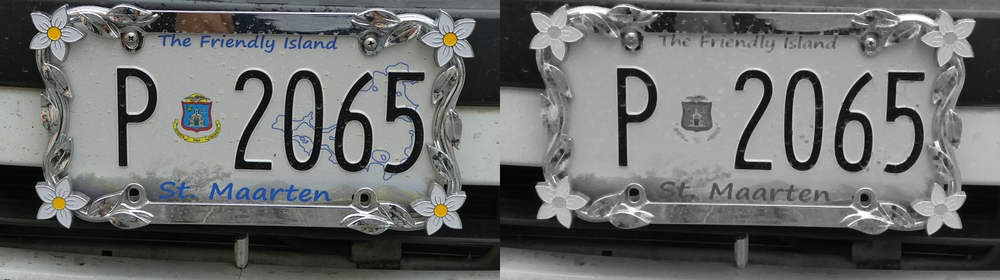

In [19]:
closing_image("Images/caribbean-plate.jpg", ">", "g", 0.5)

## Skeleton / Medial Axis

┌ Info: Precompiling OpenCV [f878e3a2-a245-4720-8660-60795d644f2a]
└ @ Base loading.jl:1662
C++ exception while wrapping module OpenCV: invalid subtyping in definition of CxxVec with supertype Any

signal (11): Segmentation fault
in expression starting at none:0
sweep_pool_page at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:1447 [inlined]
sweep_pool_pagetable0 at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:1467 [inlined]
sweep_pool_pagetable1 at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:1487 [inlined]
sweep_pool_pagetable at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:1517 [inlined]
gc_sweep_pool at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:1592
_jl_gc_collect at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:3223
ijl_gc_collect at /cache/build/default-amdci4-3/julialang/julia-release-1-dot-8/src/gc.c:3326
maybe_collect at /c

LoadError: Failed to precompile OpenCV [f878e3a2-a245-4720-8660-60795d644f2a] to /home/cesar/.julia/compiled/v1.8/OpenCV/jl_qRxK7Z.

## Watershed Segmentation

In [20]:
function watershed_image(img)    
    function get_random_color(seed)
        Random.seed!(seed)
        rand(RGB{N0f8})
    end;

    gray = Gray.(img) .> 0.5;

    dist = 1 .- distance_transform(feature_transform(gray));

    markers = label_components(dist .< -15);

    segments = watershed(dist, markers)

    out_img = map(i->get_random_color(i), labels_map(segments)) .* (1 .-gray)
    
    return mosaic_output_1d(img, out_img)

end;

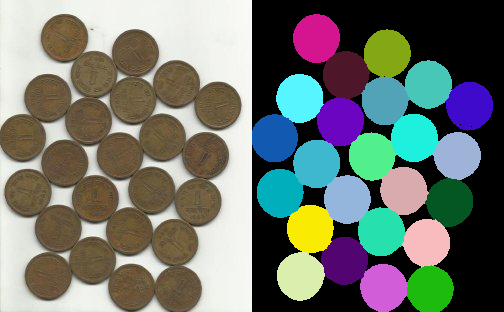

In [21]:
img = load("Images/water_coins.jpg")
watershed_image(img)

* [How to save {UINT16, 2} array to image in Julia](https://stackoverflow.com/questions/62846275/how-to-save-uint16-2-array-to-image-in-julia)
* [Image Binarization - Julia (Github)](https://github.com/JuliaImages/ImageBinarization.jl)
* [Image Binarization - Julia Documentation](https://juliaimages.org/ImageBinarization.jl/stable/)
* [Fuzzy C-means (Github)](https://github.com/JuliaStats/Clustering.jl/blob/master/doc/source/fuzzycmeans.md)
* [How the Laplacian of Gaussian Works](https://automaticaddison.com/how-the-laplacian-of-gaussian-filter-works/)
* [Laplacian of Gaussian](https://docs.opencv.org/4.x/d5/db5/tutorial_laplace_operator.html)